<a href="https://colab.research.google.com/github/alfredofosu/python.projects/blob/main/_02DataPreprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This Python notebook constitutes the second section of my thesis research implementation. Within this notebook, I illustrate the process of preprocessing raw water quality data obtained from sources such as the Toronto and Regional Conservation Authority [(TRCA)](https://data.trca.ca/dataset/regional-watershed-monitoring-program-water-quality-data), the Provincial Water Quality Monitoring Network [(PWQMN)](https://data.ontario.ca/dataset/provincial-stream-water-quality-monitoring-network), along with hydrometric data from both the TRCA and the Water Survey of Canada [(WSC)](https://wateroffice.ec.gc.ca/), as well as climate data sourced from the Meteorological Service Canada [(MSC)](https://climate.weather.gc.ca/).

# Data Preprocessing

Data preprocessing refers to the steps and techniques applied to raw data to transform it into a clean, organized, and structured format that is suitable for further analysis and modeling. It is an essential part of the data preparation phase in machine learning and data science pipelines. Data preprocessing helps in improving the quality, usability, and effectiveness of the data for subsequent tasks such as data exploration, visualization, and model training.

Common data preprocessing tasks include:

1. Data Cleaning: This involves handling missing values, dealing with outliers, correcting inconsistencies, and resolving errors in the data. Missing values can be imputed or removed based on the nature and extent of missingness. Outliers can be detected and treated using various statistical methods or replaced with more appropriate values.

2. Data Integration: When working with multiple datasets, data integration involves combining or merging the data from different sources to create a unified dataset. This process may include handling inconsistent variable names, resolving conflicts in data formats or units, and identifying and removing duplicates.

3. Data Transformation: Data transformation aims to normalize or rescale the data to improve comparability and reduce biases caused by differences in scales or distributions. Techniques such as log transformations, feature scaling (e.g., normalization or standardization), and power transformations are commonly used.

4. Feature Selection/Extraction: Feature selection involves identifying the most relevant features or variables that contribute significantly to the analysis or model performance. Feature extraction techniques, such as Principal Component Analysis (PCA) or dimensionality reduction algorithms, can be used to derive new, meaningful features from the original dataset.

5. Data Encoding: Categorical variables are typically encoded into numerical representations to be used in machine learning algorithms. This may involve techniques such as one-hot encoding, label encoding, or ordinal encoding, depending on the nature of the categorical data.

6. Handling Imbalanced Data: In situations where the classes in a classification problem are imbalanced, data preprocessing techniques like oversampling or undersampling can be employed to balance the class distribution and prevent biases towards the majority class.

7. Splitting into Training and Test Sets: The data is typically divided into training and test sets to evaluate the model's performance. This ensures that the model is not overfitting the data and can generalize well to unseen data. The data is randomly split into these sets, usually with a specified ratio (e.g., 70% training, 30% testing).

These are just some of the common data preprocessing steps, and the specific techniques used may vary depending on the nature of the data and the goals of the analysis or modeling. The objective is to prepare the data in a way that minimizes biases, enhances the quality of the input, and facilitates accurate and meaningful analyses or model training.

In [ ]:
#@title Create Virtual Environment
from IPython.display import clear_output
# !apt install python3.10-venv
# !python3 -m venv /content/drive/MyDrive/Colab_Notebooks/colab_env

# import sys
# # activate virtual environment
# !source /content/drive/MyDrive/Colab_Notebooks/colab_env/bin/activate
# #  add virtual environment path to colab's system path
# sys.path.append("/content/drive/MyDrive/Colab_Notebooks/colab_env/lib/python3.10/site-packages")
# clear_output(wait=False)

In [ ]:
#@title Install needed libraries
!pip install lets-plot
!pip install cairosvg
!pip install feature-engine
!pip install ydata-profiling
clear_output(wait=False)

In [ ]:
#@title Import Libraries
import pandas as pd
import numpy as np
import missingno as msno
%matplotlib inline

import random
import numpy as np
from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()


SEED = 0
np.random.seed(SEED)
random.seed(SEED)


# change into workingspace
%cd /content/drive/MyDrive/Colab_Notebooks/master_thesis

/content/drive/MyDrive/Colab_Notebooks/master_thesis


# Data Cleansing

The unprocessed data was retrieved utilizing APIs, and you can find the implementation details in the _01DataExtraction.ipynb notebook, which is part of Section 1 of this research implementation.

In [ ]:
#@title Import Water Quality Data
wq = pd.read_csv("./data/monitoring_stations_data/water_quality/raw_data/water_quality_data_don_river_watershed_w_dupes.csv",
                 parse_dates=["date"])
# Sort data by date ascending
wq = wq.sort_values(by=["date"], ascending=True)

# Display the last five rows
wq.tail(10)

,station_id,date,NH4,NO2-,NO3-,Turb,TN,PO43-,P,TSS,...,F-,IONB,W,Tl,Th,Tb,B,Cs,"N(NO3-,NO2-)",TOC
2623,DN008WM,2021-11-01,NaN,0.022,0.42,6.180,0.67,0.0166,0.0298,2.00,...,NaN,NaN,NaN,NaN,NaN,NaN,46.4,NaN,NaN,3.65
2621,6008501402,2021-11-01,NaN,NaN,1.12,NaN,2.05,0.0580,135.0000,15.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2624,6008500402,2021-11-01,NaN,0.022,0.47,5.260,0.75,0.0085,0.0206,2.00,...,NaN,NaN,NaN,NaN,NaN,NaN,30.6,NaN,NaN,3.87
2633,6008501402,2021-12-01,NaN,NaN,2.11,NaN,3.04,0.0550,0.0255,4.22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.22,NaN
2628,6008501402,2021-12-01,NaN,NaN,2.11,NaN,3.04,0.0550,25.5000,4.22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2629,6008500302,2021-12-01,NaN,0.027,1.08,4.255,0.68,0.0225,0.0329,2.00,...,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,NaN,3.39
2630,6008500402,2021-12-01,NaN,0.036,1.37,5.025,0.79,0.0105,0.0354,3.00,...,NaN,NaN,NaN,NaN,NaN,NaN,24.9,NaN,NaN,3.93
2631,DN008WM,2021-12-01,NaN,0.034,1.32,6.440,0.84,0.0211,0.0360,3.00,...,NaN,NaN,NaN,NaN,NaN,NaN,43.1,NaN,NaN,4.14
2632,DM 6.0,2021-12-01,NaN,0.092,2.49,4.370,0.88,0.0258,0.0492,25.00,...,NaN,NaN,NaN,NaN,NaN,NaN,58.9,NaN,NaN,5.51
2634,6008501402,2021-12-01,NaN,NaN,NaN,6.280,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#@title Metadata Analysis
# Display the metadata info about the data
wq.info()

There are 2635 monthly records of data covering a span of ca. 57 year, from 1964 to 2021. In total there are 83 water quality parameters of which some are calculated data such as Ion Balance, LSI etc. All of the data attributes have missing values which need to accounted for in order to have a relaible model outcome.

In [ ]:
#@title Descriptive Statistical Analysis
# Describe the statistics of the data
wq.describe().T

,count,mean,std,min,25%,50%,75%,max
NH4,2066.0,2.380999,21.324843,0.00200,0.10400,0.58350,2.300000,960.000000
NO2-,2272.0,0.201098,0.411219,0.00100,0.03000,0.07900,0.180000,5.000000
NO3-,2311.0,3.527336,55.764288,0.00500,0.71000,1.30000,2.055000,2324.825000
Turb,2058.0,30.133449,51.152189,-99.00000,6.42375,12.75000,30.000000,673.000000
TN,2412.0,4.140123,26.441736,0.02000,0.83000,1.70000,3.800000,1183.000000
...,...,...,...,...,...,...,...,...
Tb,8.0,0.000050,0.000000,0.00005,0.00005,0.00005,0.000050,0.000050
B,304.0,41.807566,16.479756,19.00000,29.57500,35.65000,52.975000,94.500000
Cs,8.0,0.000012,0.000004,0.00001,0.00001,0.00001,0.000016,0.000018
"N(NO3-,NO2-)",76.0,1.820316,0.709619,0.02000,1.42000,1.74000,2.197500,4.310000


Upon examining the minimum values of certain water quality parameters such as pH, Turbidity (Turb), and Total Dissolved Solids (TDS), it becomes apparent that these values contain anomalies such as -45 and -99, which are atypical for parameters of this nature. It's worth noting that pH values typically range between 1 and 14, while Turbidity and TDS should be greater than or equal to 0.

In [ ]:
#@title Revoming Erranoues Values

# Replace values less than 0 in these columns
wq.loc[wq['CNDT'] < 0, 'CNDT'] = np.nan
wq.loc[wq['Turb'] < 0, 'Turb'] = np.nan
wq.loc[wq['pH'] < 0, 'pH'] = np.nan
wq.loc[wq['TDS'] < 0, 'TDS'] = np.nan
wq.loc[wq['DEPTH'] < 0, 'DEPTH'] = np.nan
wq.loc[wq['HYDR'] < 0, 'HYDR'] = np.nan


Between 2015 and 2021, there are duplicate values in the dataset due to the sharing of water quality data by the TRCA (Toronto and Region Conservation Authority) and PWQMN (Provincial Water Quality Monitoring Network). Specifically, the data from station 6008501402 is shared by both organizations. To address this duplication, the data can be merged by calculating the mean values based on grouping the data by the stations and datetime values. This process ensures that the dataset is consolidated and removes any redundant or overlapping entries, providing a more accurate representation of the water quality data.

In [ ]:
#@title Data Aggregation

# Groub by station and date; aggregate by their means to remove duplicates. If two values are the same
# their mean value will still be the same
wq_grouped = wq.copy().groupby(by=['station_id','date',]).mean()

# Use DataFrame.reindex() to change the order of the columns alphabetically
wq_grouped = wq_grouped.reindex(columns=sorted(list(wq_grouped.columns), key=lambda s: s.casefold())).reset_index()

In [ ]:
# Display the last 10 lines confirm that there aren't anymore duplicaitons
wq_grouped.tail(10)

,station_id,date,Ag,Al,ALKT,As,B,Ba,Be,Bi,...,TN,TOC,TS,TSS,Turb,U,V,W,Zn,Zr
2109,DN008WM,2021-03-01,0.01,25.0,270.38,0.485,55.4,150.0,0.05,NaN,...,0.68,4.34,NaN,2.0,13.005,NaN,0.481,NaN,10.0,NaN
2110,DN008WM,2021-04-01,0.01,97.7,184.10,0.524,36.3,105.0,0.05,NaN,...,0.97,6.58,NaN,3.0,8.050,NaN,0.598,NaN,10.0,NaN
2111,DN008WM,2021-05-01,0.01,55.4,296.71,0.727,59.0,155.0,0.05,NaN,...,0.94,3.80,NaN,5.0,6.105,NaN,0.791,NaN,10.0,NaN
2112,DN008WM,2021-06-01,0.01,41.6,269.70,0.776,55.3,124.0,0.05,NaN,...,0.71,5.28,NaN,13.0,5.930,NaN,0.648,NaN,10.0,NaN
2113,DN008WM,2021-07-01,0.01,235.0,255.50,1.100,59.6,125.0,0.05,NaN,...,1.02,5.63,NaN,5.0,7.445,NaN,1.740,NaN,10.0,NaN
2114,DN008WM,2021-08-01,0.01,43.1,250.70,0.688,62.9,129.0,0.05,NaN,...,0.66,3.11,NaN,8.0,7.450,NaN,1.220,NaN,10.0,NaN
2115,DN008WM,2021-09-01,0.01,1520.0,103.40,0.763,25.2,35.8,0.05,NaN,...,0.89,3.19,NaN,73.0,58.800,NaN,1.970,NaN,14.3,NaN
2116,DN008WM,2021-10-01,0.01,98.5,191.90,0.490,37.2,63.4,0.05,NaN,...,0.82,8.02,NaN,2.0,5.565,NaN,0.858,NaN,10.0,NaN
2117,DN008WM,2021-11-01,0.01,25.2,272.70,0.781,46.4,109.0,0.05,NaN,...,0.67,3.65,NaN,2.0,6.180,NaN,0.294,NaN,10.0,NaN
2118,DN008WM,2021-12-01,0.01,62.9,295.50,0.309,43.1,113.0,0.05,NaN,...,0.84,4.14,NaN,3.0,6.440,NaN,0.585,NaN,10.0,NaN


After merging the data, the dataset now consists of **2119** monthly records.

In [ ]:
# Save the data without duplicates
with open(
    f"./data/monitoring_stations_data/water_quality/raw_data/water_quality_data_don_river_watershed_final.csv",'w') as file_csv:
  wq_grouped.to_csv(file_csv, index=False)

# Data Integration

In [ ]:
#@title Merge Water Quality Data with Station Location Data
ms = pd.read_csv("./data/monitoring_stations_metadata/all_monitoring_stations_don_river_watershed.csv",
                 parse_dates=["start date", "end date"])
ms.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129 entries, 0 to 128
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   station_id     129 non-null    object        
 1   location_name  127 non-null    object        
 2   latitude       129 non-null    float64       
 3   longitude      129 non-null    float64       
 4   parameter      129 non-null    object        
 5   dataset_name   36 non-null     object        
 6   unit           129 non-null    object        
 7   start date     129 non-null    datetime64[ns]
 8   end date       129 non-null    datetime64[ns]
 9   status         129 non-null    object        
 10  subwatershed   129 non-null    object        
 11  agency         129 non-null    object        
dtypes: datetime64[ns](2), float64(2), object(8)
memory usage: 12.2+ KB


In [ ]:
# remove duplicate station names as TRCA and PWQMN have similar names for some of their stations
wq_stations = ms.loc[ms["parameter"]=="water quality"].drop_duplicates(subset='station_id')

wq_stations['operation_years'] = round((wq_stations['end date'] - wq_stations['start date']).dt.days/365, 1).astype("int")

wq_stations

,station_id,location_name,latitude,longitude,parameter,dataset_name,unit,start date,end date,status,subwatershed,agency,operation_years
109,6008500302,Bayview And Steeles Ave Toronto,43.803,-79.397,water quality,NaN,mg/L,2015-01-01,2021-12-31,A,Upper East Don,TRCA,7
110,6008500402,Highway 7 West Of Concord,43.804,-79.483,water quality,NaN,mg/L,2015-01-01,2021-12-31,A,Upper West Don,TRCA,7
111,6008501402,"Pottery Rd, Toronto",43.689,-79.362,water quality,NaN,mg/L,2015-01-01,2021-12-31,A,Lower Don,TRCA,7
112,DM 6.0,NaN,43.703,-79.332,water quality,NaN,mg/L,2015-01-01,2021-12-31,A,Taylor Massey Creek,TRCA,7
113,DN008WM,NaN,43.800,-79.381,water quality,NaN,mg/L,2015-01-01,2021-12-31,A,German Mills Creek,TRCA,7
114,6008500102,Lakeshore Road Toronto,43.651,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
115,6008500202,Sheppard Ave Toronto,43.757,-79.430,water quality,NaN,mg/L,1965-01-01,1993-12-31,I,Lower West Don,PWQMN,29
118,6008501302,Bayview Exit From Don Valley Parkway,43.680,-79.366,water quality,NaN,mg/L,1972-01-01,1991-12-31,I,Lower Don,PWQMN,20
120,6008501802,Queen Street Bridge,43.658,-79.354,water quality,NaN,mg/L,2000-01-01,2000-12-31,I,Lower Don,PWQMN,1
121,6008500502,16Th Ave Down Str from Richmond Hill Stp,43.854,-79.428,water quality,NaN,mg/L,1964-01-01,1988-12-31,I,German Mills Creek,PWQMN,25


In [ ]:
wq_merged = wq_grouped.merge(wq_stations, how="left", left_on="station_id", right_on="station_id", validate="m:1",)

# save the merged file to a designated path/folder
with open(f"./data/monitoring_stations_data/water_quality/raw_data/water_quality_data_merged_w_geospatial.csv",'w') as file_csv:
  wq_merged.to_csv(file_csv, index=False)


wq_merged.head(10)

,station_id,date,Ag,Al,ALKT,As,B,Ba,Be,Bi,...,longitude,parameter,dataset_name,unit,start date,end date,status,subwatershed,agency,operation_years
0,6008500102,1964-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
1,6008500102,1964-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
2,6008500102,1965-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
3,6008500102,1965-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
4,6008500102,1965-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
5,6008500102,1965-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
6,6008500102,1965-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
7,6008500102,1965-10-01,NaN,NaN,260.0,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
8,6008500102,1966-03-01,NaN,NaN,219.0,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32
9,6008500102,1966-05-01,NaN,NaN,252.0,NaN,NaN,NaN,NaN,NaN,...,-79.347,water quality,NaN,mg/L,1964-01-01,1995-12-31,I,Lower Don,PWQMN,32


# Exploratory Data Analysis (EDA)

In [ ]:
#@title Raw Data Profiling Report
from ydata_profiling import ProfileReport

# Create a ProfileReport
profile = ProfileReport(wq_grouped[['Ca2+', 'Cl-', 'K+', 'Na+', 'Mg2+', 'SO42-', 'TDS',
                                    'ALKT', 'HARD', 'CNDT', 'Temp', 'pH']].copy(),
                        title="Water Quality Dataset Profiling Report", explorative=True)

# Generate the report (HTML format)
profile.to_file("Water_Quality_Don_Watershed_Dataset_Profiling_Report.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#@title Feature Selection
wq_params = ['date', 'station_id',
             'Ca2+','Cl-', 'K+', 'Mg2+', 'Na+',  'SO42-', 'TDS',
             'ALKT', 'CNDT', 'HARD', 'pH']
params = ['date', 'station_id',
          'Ca2+','Cl-', 'K+', 'Mg2+', 'Na+',  'SO42-', 'TDS',
          'ALKT', 'CNDT', 'HARD', 'pH',
          'avg_water_Temp', 'avg_discharge', 'avg_stage',
          'avg_temp', 'ttl_precip', 'max_Wx', 'max_Wy']
# calculate 'ION-', 'ION+', 'IONB', BiCarbonates and Carbonates

## Data Visualization

In [ ]:
#@title Reload the Dataset
wq_raw_df = pd.read_csv(
    f"./data/monitoring_stations_data/water_quality/raw_data/water_quality_data_merged_w_geospatial.csv", parse_dates=['date'])

subwatershed_dict = {}
for subwatershed in wq_raw_df['subwatershed'].unique():
  df = wq_raw_df[wq_raw_df['subwatershed'] == subwatershed].copy()
  df['date'] = pd.to_datetime(df['date'])
  subwatershed_dict['_'.join(subwatershed.lower().split())+'_data'] = df.reset_index(drop=True)

In [ ]:
#@title Concentration Plots - Facet Plots

def melt_dataframe(data: pd.DataFrame):
  df = data.copy()
  df.date = pd.to_datetime(df.date)
  df["day"] = df.date.dt.day
  df["month"] = df.date.dt.month
  df["year"] = df.date.dt.year
  df = df.loc[df['year'] >= 2015]
  df = df.set_index(["date","year", "month", "day",])
  df = df.melt(var_name="param", value_name="concentration [mg/L]", ignore_index=False, ).reset_index()
  return df

# plot lines
def plot_facet_line(data: pd.DataFrame, subwatershed_name:str):
  df = melt_dataframe(data)
  plot = (ggplot(df, aes("date", "concentration [mg/L]"))
    + geom_line(aes(group="param", color="param"), size=1)
    + scale_x_datetime(breaks=df[df.date.dt.day == 1].date, format="%b %Y")
    + facet_grid(y="param", scales='free_y')
    + labs(title=f"Monthly Concentrations of Major Ions - {subwatershed_name}",
           subtitle=f"Jan 2015 to Dec 2021",
            x="", y='concentration [mg/L]', color="",
           caption="Master Thesis @ Alfred Ofosu, 08/2023")
    + ggsize(800, 1000)
    + scale_color_manual(values=['#141f1e','#009ddc', '#ac8583', '#475353', '#f2542d', '#69140e', '#b4b184'], name='')
    + theme(legend_position='none')
    )
  return plot, ggsave(plot, f'facet_plot_{"_".join(subwatershed_name.lower().split())}_major_ions.png',
                      path=f'./data/images/{"_".join(subwatershed_name.lower().split())}')

In [ ]:
p, _ = plot_facet_line(subwatershed_dict['upper_west_don_data'][['date','Ca2+', 'Cl-','K+', 'Mg2+', 'Na+', 'SO42-','TDS',]], 'Upper West Don')
p

In [ ]:
p, _ = plot_facet_line(subwatershed_dict['upper_east_don_data'][['date','Ca2+','Cl-','K+','Mg2+','Na+','SO42-','TDS',]], "Upper East Don")
p

In [ ]:
p, _ = plot_facet_line(subwatershed_dict['german_mills_creek_data'][['date','Ca2+','Cl-','K+','Mg2+','Na+','SO42-','TDS',]],
                       "German Mills Creek")
p

In [ ]:
p, _ = plot_facet_line(subwatershed_dict['taylor_massey_creek_data'][['date','Ca2+','Cl-','K+','Mg2+','Na+','SO42-','TDS', ]],
                       "Taylor Massey Creek")
p

In [ ]:
p, _ = plot_facet_line(subwatershed_dict['lower_don_data'][['date','Ca2+','Cl-','K+','Mg2+','Na+','SO42-','TDS', ]],
                       "Lower Don")
p

In [ ]:
#@title Frequency Plots
from datetime import datetime
def plot_frequencies(data, date_column_name, subwatershed_name):

  plot = (
      ggplot(data)
      + geom_bar(aes(x=data[date_column_name].dt.year, fill='station_id'),
                       data=data,
                       position="stack",
                       tooltips=layer_tooltips().format('@x', '.0f').format('^y', '.0f').min_width(25),
                       stats='bins',
                 )
      + geom_vline(xintercept=2015, color="red", linetype="dashed", size=1,
                   tooltips=layer_tooltips().format('^x', '.0f'),
                   )
      # + geom_hline(yintercept=round(df.groupby(data[date_column_name].dt.year)[date_column_name].count().mean()),
      #              linetype="dashed", size=1,)
      + geom_text(label="TRCA data", x=2015.5, y=12.5, hjust='left',
                  color="red")
      + xlim(1964, 2021)
      + scale_x_continuous(format='.0f')
      + scale_fill_discrete(name="Station")
      + scale_alpha(range=[0.1, 0.5], guide="none")
      + labs(title=f"Annual Observation Frequency - {subwatershed_name}",
            subtitle=f"Water Quality Parameters observed by the PWQMN and TRCA",
            x="", y='Number of Observations', color="",
            caption="Water samples were collected and tested monthly.\n Master Thesis @ Alfred Ofosu, 08/2023")
      + ggsize(800, 400)
      + scale_fill_manual(values=['#48beff','#99d19c', '#dd9e3f', '#475353',
                                  '#1985a1', '#79cf0c', '#9d8189', '#b73029',
                                  '#17c3b2'], name='')
  )

  return plot, ggsave(plot, f'{"_".join(subwatershed_name.lower().split())}_freq.png',
                      path=f'./data/images/{"_".join(subwatershed_name.lower().split()[:-1])}')


def plot_line(data: pd.DataFrame, param, name, subwatershed_name, stationary:bool, shift:int, min_year:int):
  df = data.copy()
  df["date"] = pd.to_datetime(df["date"])
  df["year"] = df["date"].dt.year
  df = df[df["year"] > min_year]
  if stationary is True:
    df[f"{param}_diff"] = df[param].diff() #- df[param].shift(shift)
    dff = df[f"{param}_diff"]
  else: dff = df[param]

  p = (
      ggplot(df, aes(x='date', y=dff))
      + geom_line(tooltips=layer_tooltips().format('^y', '.0f').min_width(25), color='#1985a1')
      + geom_line(stat='smooth', color='darkgreen', linetype='longdash')
      + geom_line(data=df, mapping=aes(x='date', y=dff.ewm(com=0.5).mean()),
                  linetype="dotdash", size=1, colour="red")
      + labs(title=f'Monthly Concerntrations of {name} in the {" ".join(subwatershed_name.title().split("_"))}',
            subtitle=f"Jan 2015 to Dec 2021",
            x="", y=f'{name} in [mg/L]', color="",
            caption="green dash line: mean concentration, red dot-dash line: EWMA.\n Master Thesis @ Alfred Ofosu, 08/2023")
      + ggsize(800, 400)
      # + scale_color_manual(values=['#48beff','#99d19c', '#dd9e3f', '#475353', '#1985a1', '#79cf0c', '#9d8189'], name='')
      + scale_x_datetime(format="%Y")
  )

  return p, ggsave(p, f'monthly_{"_".join(name.lower().split())}_conctr_{subwatershed_name}.png',
                   path=f'./data/images/{"_".join(subwatershed_name.lower().split())}')

param_names ={'Ca2+':'Calcium',
              'Cl-':'Chloride',
              'K+': 'Potassium',
              'Mg2+': 'Magnesium',
              'Na+': 'Sodium',
              'SO42-': 'Sulphate',
              'TDS': 'Total Dissolved Solids'}

In [ ]:
#@title Upper West Don Subwatershed
upper_west_df = subwatershed_dict['upper_west_don_data']

In [ ]:
# Print the number of unique years in the Upper West Don region for which water qaulity data was recorded
print(upper_west_df.date.dt.year.unique())

[1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979
 1980 1981 1982 1983 1984 1985 1986 1987 1988 1991 1992 1993 1994 1995
 1997 2015 2016 2017 2018 2019 2020 2021]


In [ ]:
plot, _ = plot_frequencies(upper_west_df, 'date', 'Upper West Don Subwatershed')
plot

In [ ]:
upper_west_plots=[]
for param, param_name in param_names.items():
  plot, _ = plot_line(upper_west_df[wq_params], param , param_name, "upper_west_don", stationary=False, shift=-1, min_year=2015)
  upper_west_plots.append(plot)

upper_west_plots[0]

In [ ]:
#@title Lower West Don Subwatershed
lower_west_df = subwatershed_dict['lower_west_don_data']

# Print the number of unique years in the Upper West Don region for which water qaulity data was recorded
print(lower_west_df.date.dt.year.unique())

[1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978
 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1991 1992 1993]


In [ ]:
plot, _ = plot_frequencies(lower_west_df, 'date', 'Lower West Don Subwatershed')
plot

In [ ]:
# lower_west_plots=[]
# for param, param_name in param_names.items():
#   if param == 'Cl-' or param == 'TDS':
#     plot, _ = plot_line(lower_west_df[wq_params], param , param_name, "lower_west_don", stationary=False, shift=-1, min_year=1980)
#     lower_west_plots.append(plot)

# lower_west_plots[1]

In [ ]:
df = lower_west_df[lower_west_df.date.dt.year > 1970].copy()
df.date = pd.to_datetime(df.date)
subwatershed_name = 'lower_west_don'
for param, name in param_names.items():
  if param == 'Cl-' or param == 'TDS':
    p = (
        ggplot(df, aes(x="date", y=param))
        + geom_line(tooltips=layer_tooltips().format('^y', '.0f').min_width(25), color='#1985a1')
        + geom_line(stat='smooth', color='darkgreen', linetype='longdash')
        + geom_line(data=df, mapping=aes(x='date', y=df[param].ewm(com=0.5).mean()),
                    linetype="dotdash", size=1, colour="red")
        + labs(title=f'Monthly Concerntrations of {name} in the {" ".join(subwatershed_name.title().split("_"))}',
              subtitle=f"Jan 1970 to Dec 1993",
              x="Year", y=f'{name} in [mg/L]', color="",
              caption="green dash line: mean concentration, red dot-dash line: EWMA.\n Master Thesis @ Alfred Ofosu, 08/2023")
        + ggsize(800, 400)
        + scale_x_datetime(format="%Y")
        )
    ggsave(p, f'monthly_{"_".join(name.lower().split())}_conctr_{subwatershed_name}.png',
                    path=f'./data/images/{"_".join(subwatershed_name.lower().split())}')


In [ ]:
#@title Upper East Don Subwatershed
upper_east_df = subwatershed_dict['upper_east_don_data']

# Print the number of unique years in the Upper East Don region for which water qaulity data was recorded
print(upper_east_df.date.dt.year.unique())

[1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979
 1980 1981 1982 1983 1984 1985 1986 1987 1988 1991 1992 1993 1994 1995
 1997 2015 2016 2017 2018 2019 2020 2021]


In [ ]:
plot, _ = plot_frequencies(upper_east_df, 'date', 'Upper East Don Subwatershed')
plot

In [ ]:
upper_east_plots=[]
for param, param_name in param_names.items():
  plot, _ = plot_line(upper_east_df[wq_params], param , param_name, "upper_east_don",stationary=False, shift=-1, min_year=2015)
  upper_east_plots.append(plot)

upper_east_plots[0]

In [ ]:
#@title Lower East Don Subwatershed
# lower_east_df = subwatershed_dict ['lower_east_don_data']

The Lower East Don basin does not have dedicated water quality stations. However, there are available meteorological and
hydrometric data that can be appended to the East Don River dataset. This augmentation of data will help fill in the missing
values in the Upper East Don and Taylor-Massey Creek basins, enhancing the completeness and accuracy of the datasets for these
regions. By incorporating the relevant meteorological and hydrometric information, we can provide a more comprehensive
understanding of the water quality dynamics in the Upper East Don and Taylor-Massey Creek basins, despite the absence of
dedicated water quality stations in the Lower East Don basin.

In [ ]:
#@title German Mills Creek Subwatershed
german_mills_creek_df = subwatershed_dict['german_mills_creek_data']

# Print the number of unique years in the German Mills Creek region for which water qaulity data was recorded
print(german_mills_creek_df.date.dt.year.unique())

[1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 2015 2016 2017
 2018 2019 2020 2021]


In [ ]:
plot, _ = plot_frequencies(german_mills_creek_df, 'date', 'German Mills Creek Subwatershed')
plot

In [ ]:
german_mills_creek_plots=[]
for param, param_name in param_names.items():
  plot, _ = plot_line(german_mills_creek_df[wq_params], param , param_name, "german_mills_creek", stationary=False, shift=-1, min_year=2015)
  german_mills_creek_plots.append(plot)

german_mills_creek_plots[0]

In [ ]:
#@title Taylor-Massey Creek Subwatershed
taylor_massey_creek_df = subwatershed_dict['taylor_massey_creek_data']

# Print the number of unique years in the Taylor-Massey Creek region for which water qaulity data was recorded
print(taylor_massey_creek_df.date.dt.year.unique())

[2015 2016 2017 2018 2019 2020 2021]


In [ ]:
plot, _ = plot_frequencies(taylor_massey_creek_df, 'date', 'Taylor-Massey Creek Subwatershed')
plot

In [ ]:
taylor_massey_creek_plots=[]
for param, param_name in param_names.items():
  plot, _ = plot_line(taylor_massey_creek_df[wq_params], param , param_name, "taylor_massey_creek", stationary=False, shift=-1, min_year=2015)
  taylor_massey_creek_plots.append(plot)

taylor_massey_creek_plots[0]

In [ ]:
#@title Lower Don Subwatershed
lower_don_df = subwatershed_dict['lower_don_data']

# Print the number of unique years in the Lower Don region for which water qaulity data was recorded
print(lower_don_df.date.dt.year.unique())

[1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [ ]:
plot, _ = plot_frequencies(lower_don_df, 'date', 'Lower Don Subwatershed')
plot

In [ ]:
lower_don_plots=[]
for param, param_name in param_names.items():
  plot, _ = plot_line(lower_don_df[wq_params], param , param_name, "lower_don", stationary=False, shift=-1, min_year=2015)
  lower_don_plots.append(plot)

lower_don_plots[0]

In [ ]:
w, h = 800, 400
bunch = GGBunch()
bunch.add_plot(upper_west_plots[1], 0, 0)
bunch.add_plot(upper_east_plots[1], w, 0)
bunch.add_plot(german_mills_creek_plots[1], 0, h)
bunch.add_plot(taylor_massey_creek_plots[1], w, h)
bunch.add_plot(lower_don_plots[1], 0, 2*h)
bunch.show()

# Imputing Missing Values
These implementations were inspired by [SciKit Learn](https://scikit-learn.org/stable/auto_examples/impute/plot_missing_values.html#sphx-glr-auto-examples-impute-plot-missing-values-py)

The data between 2015 and 2021 are adequate to test the different imputaiton methods. We will then sample the data between these years

In [ ]:
# Copy and set the index to a datetime index
df_impute = wq_raw_df.set_index('date').copy()

# Select all years greater or equal to 2015
df_impute = df_impute[df_impute.index.year >= 2015]

# Select only the model paramters
df_impute = df_impute[['ALKT','Ca2+','Cl-', 'CNDT','HARD','K+', 'Mg2+','Na+','pH','SO42-','TDS', 'Temp',]]
df_impute = df_impute.fillna(df_impute.mean())

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler

# Pipeline to scale the data
pipeline = make_pipeline (
    ColumnTransformer(
        transformers=[
            ("numerical", StandardScaler(), df_impute.columns)
        ],
        remainder="passthrough",
        verbose_feature_names_out=False,
    )
).set_output(transform="pandas")

df_impute_scaled = pipeline.fit_transform(df_impute)

In [ ]:
# Create indepedent features and a dependent target (TDS)
X_full, y_full = df_impute_scaled.values, df_impute_scaled['TDS'].values

Given that we are forecasting future events based on past occurrences, it's important to retain the target variable within the features, particularly considering that the dataset is a time series. The generated profile report highlights that approximately 48% of cells contain missing values, indicating that the imputation process will involve removing roughly 50% of the data entries.

In [ ]:
rng = np.random.RandomState(SEED)
# A function to add missing values
def add_missing_values(X_full, y_full, missing_rate):
  n_samples, n_features = X_full.shape

  # Add missing values in 50% of the lines
  missing_rate = missing_rate
  n_missing_samples = int(n_samples * missing_rate)

  missing_samples = np.zeros(n_samples, dtype=bool)
  missing_samples[:n_missing_samples] = True

  rng.shuffle(missing_samples)
  missing_features = rng.randint(0, n_features, n_missing_samples)
  X_missing = X_full.copy()
  X_missing[missing_samples, missing_features] = np.nan
  y_missing = y_full.copy()

  return X_missing, y_missing
X_miss, y_miss = add_missing_values(X_full, y_full, 0.50)

In [ ]:
from pandas.core.common import random_state
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import TimeSeriesSplit
from feature_engine.imputation import EndTailImputer


# To use the experimental IterativeImputer, we need to explicitly ask for it:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

tscv = TimeSeriesSplit(n_splits=5)
regressor = RandomForestRegressor(random_state=rng)


# A function to get the MSE scores
def get_scores_for_imputer(imputer, X_missing, y_missing):
    estimator = make_pipeline(imputer, regressor)
    impute_scores = cross_val_score(
        estimator, X_missing, y_missing, scoring="neg_mean_squared_error", cv=tscv
    )
    return impute_scores
x_labels = []

mses = np.zeros(7)
stds = np.zeros(7)

# A function to get the scores on the full dataset
def get_full_score(X_full, y_full):
    full_scores = cross_val_score(
        regressor, X_full, y_full, scoring="neg_mean_squared_error", cv=tscv
    )
    return full_scores.mean(), full_scores.std()
mses[0], stds[0] = get_full_score(X_full, y_full)
x_labels.append("Full data")

# Imputation with a constant value 0
def get_impute_zero_score(X_missing, y_missing):
    imputer = SimpleImputer(
        missing_values=np.nan, add_indicator=True, strategy="constant", fill_value=0
    )
    zero_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
    return zero_impute_scores.mean(), zero_impute_scores.std()

mses[1], stds[1] = get_impute_zero_score(X_miss, y_miss)
x_labels.append("Zero imputation")

# Imputation with the mean value
def get_impute_mean(X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, strategy="mean", add_indicator=True)
    mean_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
    return mean_impute_scores.mean(), mean_impute_scores.std()

mses[2], stds[2] = get_impute_mean(X_miss, y_miss)
x_labels.append("Mean Imputation")

# Imputation with the median value
def get_impute_median(X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, strategy="median", add_indicator=True)
    median_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
    return median_impute_scores.mean(), median_impute_scores.std()

mses[3], stds[3] = get_impute_median(X_miss, y_miss)
x_labels.append("Median Imputation")

# Imputation with the KNN algorithm
def get_impute_knn_score(X_missing, y_missing):
    imputer = KNNImputer(missing_values=np.nan, add_indicator=True)
    knn_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
    return knn_impute_scores.mean(), knn_impute_scores.std()

mses[4], stds[4] = get_impute_knn_score(X_miss, y_miss)
x_labels.append("KNN Imputation")

# Imputation with the Iterative algorithm
def get_impute_iterative(X_missing, y_missing):
    imputer = IterativeImputer(
        missing_values=np.nan,
        add_indicator=True,
        random_state=0,
        n_nearest_features=5,
        max_iter=15,
        sample_posterior=True,
        min_value=0.0
    )
    iterative_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
    return iterative_impute_scores.mean(), iterative_impute_scores.std()
mses[5], stds[5] = get_impute_iterative(X_miss, y_miss)
x_labels.append("Iterative Imputation")

# Imputing with endtail values
def get_impute_endtail(X_missing, y_missing):
  imputer =  EndTailImputer(imputation_method='gaussian', tail='right', fold=3)
  endtail_impute_scores = get_scores_for_imputer(imputer, X_missing, y_missing)
  return endtail_impute_scores.mean(), endtail_impute_scores.std()

mses[6], stds[6] = get_impute_mean(X_miss, y_miss)
x_labels.append("End Tail Imputation")

mses= mses * -1

mses

array([0.05224538, 0.0889987 , 0.09245057, 0.08909977, 0.06755791,
       0.05875843, 0.09245057])

In [ ]:
df_errors = pd.DataFrame({'Imputation Techniques':x_labels, 'Errors':mses, 'Std': stds})
df_errors

,Imputation Techniques,Errors,Std
0,Full data,0.052245,0.068933
1,Zero imputation,0.088999,0.097223
2,Mean Imputation,0.092451,0.101337
3,Median Imputation,0.089100,0.097986
4,KNN Imputation,0.067558,0.076732
5,Iterative Imputation,0.058758,0.068445
6,End Tail Imputation,0.092451,0.101337


In [ ]:
# Plot error ranges on Bar plot
df_errors = pd.DataFrame({'Imputation Techniques':x_labels, 'MSE':mses, 'Std': stds})
y_fulldata = df_errors[df_errors['Imputation Techniques'] == 'Full data']['MSE']

p = (ggplot(df_errors,)
+ geom_bar(aes(x='MSE', y='Imputation Techniques', fill='Std'), stat='identity', position='dodge', color='black', orientation='y')
+ scale_fill_continuous(low='#edede9', high='#8d99ae', name='Std')
+ labs(title=f"Imputation techniques with 50% of missing water quality data",
            subtitle=f"Comparison of Mean Squared Errors (MSE*) with target as TDS",
            x="MSE", y="", color="",
            caption="*evaluated with a timeseries cross-validation split \n Master Thesis @ Alfred Ofosu, 08/2023")
+ geom_vline(xintercept=float(y_fulldata.values), color="red", linetype="dashed", size=1,)
+ ggsize(800,500)
)
ggsave(p, f'missing_values_imputation_bar_plot.png', path=f'./data/images')
p

In [ ]:
df_selected = wq_raw_df.set_index(['date']).copy()

# Select all years greater or equal to 2015
df_selected = df_selected[df_selected['subwatershed'] == 'Lower Don']

df_selected = df_selected[['Ca2+','Cl-', 'K+', 'Mg2+','Na+','SO42-','TDS',
                           'ALKT','CNDT','HARD','pH','Temp',]].resample('M').mean(numeric_only=True)

# Replace pd.NaN with np.nan
df_selected.replace("NaN", np.nan, inplace=True)

In [ ]:
df_selected

,Ca2+,Cl-,K+,Mg2+,Na+,SO42-,TDS,ALKT,CNDT,HARD,pH,Temp
date,,,,,,,,,,,,
1964-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.000
1964-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1964-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000
1965-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000
1965-02-28,NaN,NaN,NaN,NaN,NaN,NaN,573.000000,NaN,NaN,NaN,NaN,5.000
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31,74.166667,216.333333,3.673333,16.25,144.566667,25.4,727.333333,147.800,1299.416667,252.333333,8.228750,21.275
2021-09-30,54.700000,75.900000,2.830000,6.65,52.700000,NaN,312.000000,316.250,482.000000,164.000000,8.016667,16.260
2021-10-31,69.000000,44.400000,3.790000,15.00,144.000000,NaN,691.000000,162.725,1122.000000,234.000000,8.043333,9.800


In [ ]:
# To use the experimental IterativeImputer, we need to explicitly ask for it:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer

zero_imputer = SimpleImputer(
    missing_values=np.nan,
    add_indicator=True,
    strategy="constant",
    fill_value=0
    )
df_zero = pd.DataFrame(zero_imputer.fit_transform(df_selected),
                      index=df_selected.index,
                      columns=zero_imputer.get_feature_names_out()
                      ).reset_index()
df_zero['date'] = pd.to_datetime(df_zero['date'])

mean_imputer = SimpleImputer(
    missing_values=np.nan,
    strategy="mean",
    add_indicator=True
    )
df_mean = pd.DataFrame(mean_imputer.fit_transform(df_selected),
                      index=df_selected.index,
                      columns=mean_imputer.get_feature_names_out()
                      ).reset_index()
df_mean['date'] = pd.to_datetime(df_mean['date'])

median_imputer = SimpleImputer(
    missing_values=np.nan,
    strategy="median",
    add_indicator=True
    )
df_median = pd.DataFrame(median_imputer.fit_transform(df_selected),
                      index=df_selected.index,
                      columns=median_imputer.get_feature_names_out()
                      ).reset_index()
df_median['date'] = pd.to_datetime(df_median['date'])

KNN_imputer = KNNImputer(
    missing_values=np.nan,
    n_neighbors = 5,
    add_indicator=True
    )
df_KNN = pd.DataFrame(KNN_imputer.fit_transform(df_selected),
                      index=df_selected.index,
                      columns=KNN_imputer.get_feature_names_out()
                      ).reset_index()
df_KNN['date'] = pd.to_datetime(df_KNN['date'])

iterative_imputer = IterativeImputer(
    missing_values=np.nan,
    add_indicator=True,
    random_state=0,
    n_nearest_features=5,
    max_iter=15,
    min_value=0.0,
    sample_posterior=True,
    )
df_ite = pd.DataFrame(iterative_imputer.fit_transform(df_selected),
                      index=df_selected.index,
                      columns=iterative_imputer.get_feature_names_out()
                      ).reset_index()
df_ite['date'] = pd.to_datetime(df_ite['date'])

endTail_imputer = EndTailImputer(
    imputation_method='gaussian',
    tail='right', # Gaussian limits for right tail: mean + 3*std
    fold=3,
    )
df_endtail = pd.DataFrame(endTail_imputer.fit_transform(df_selected),
                          index=df_selected.index,
                          columns=df_selected.columns
                          ).reset_index()
df_endtail['date'] = pd.to_datetime(df_endtail['date'])

In [ ]:
df_original = df_selected.reset_index()
df_original['date'] = pd.to_datetime(df_original['date'])
target = 'Ca2+'
n_months = 325
p1 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_ite.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"Iterative Imputation of {target}",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p1, f'missing_values_iterative_imputation.png', path=f'./data/images')
p1

In [ ]:
p2 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_zero.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"Simple Imputation of {target} with zero values",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p2, f'missing_values_zero_imputation.png', path=f'./data/images')
p2

In [ ]:
p3 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_mean.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"Simple Imputation of {target} with mean values",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p3, f'missing_values_mean_imputation.png', path=f'./data/images')
p3

In [ ]:
p4 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_median.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"Simple Imputation of {target} with medial values",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p4, f'missing_values_median_imputation.png', path=f'./data/images')
p4

In [ ]:
p5 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_KNN.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"KNN Imputation of {target}",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p5, f'missing_values_KNN_imputation.png', path=f'./data/images')
p5

In [ ]:
p6 =(ggplot(df_original.tail(n_months),aes(x='date', y=target)) + geom_line(color='#1985a1')
+ geom_line(mapping = aes(x='date', y=target), data=df_endtail.tail(n_months),
            linetype="dotdash", size=0.8, color="red")
+ ggsize(900,400)
+ labs(title=f"Gaussian Endtail Imputation of {target} with + 3 Std values",
            subtitle=f"Comparing raw data with imputed data",
            x="", y=f"{target} in mg/L", color="",
            caption="Master Thesis @ Alfred Ofosu, 08/2023")
+ scale_x_datetime(format="%Y")
)
ggsave(p6, f'missing_values_endTail_imputation.png', path=f'./data/images')
p6

# Data Processing

In [ ]:
#@title Reload the dataset
import os

def get_subwatershed_data(path):
  file_names = []
  for file in os.listdir(path):
      if os.path.isfile(os.path.join(path, file)):
          file_names.append(file)
  data_dictionary = {}
  for filename in file_names:
    file_path = os.path.join(path, filename)
    df = pd.read_csv(file_path, parse_dates=['date'], dtype={'station_id':'object'},)
    data_dictionary[os.path.splitext(os.path.basename(file_path))[0]] = df
  return data_dictionary


subwatershed_dict = get_subwatershed_data('./data/monitoring_stations_data/water_quality/raw_data/water quality by subwatershed')

In [ ]:
def join_datasets(dataset:dict, df_stations:pd.DataFrame):
  df_list = []
  for subwatershed, data in dataset.items():
    if "station_id" in list(data.columns):
      for station in list(data["station_id"].unique()):
        df = data.loc[data["station_id"] == station]
        df = df.set_index('date')
        df = df.resample(rule='M', origin="start" ).mean(numeric_only=True)
        df["station_id"] = station

        df_list.append(df)
  df_combinded = pd.concat(df_list)
  index = df_combinded.index

  df_combinded = df_combinded.merge(df_stations[['station_id', 'subwatershed']], on="station_id", how="left")
  df_combinded.set_index(index, inplace=True)
  return df_combinded

df_combinded = join_datasets(subwatershed_dict, wq_stations)

In [ ]:
df_combinded.sort_index()

,Ag,Al,ALKT,As,B,Ba,Be,Bi,BOD,Br-,...,avg_temp,ttl_precip,ttl_snow,snow_on_ground,min_rel_humidity,max_rel_humidity,max_Wx,max_Wy,station_id,subwatershed
date,,,,,,,,,,,,,,,,,,,,,
1965-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.5,NaN,...,-3.957258,1.944758,0.864516,0.947581,17.544355,22.645161,8.829456,3.719266,6008500502,German Mills Creek
1965-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6008500202,Lower West Don
1965-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,NaN,...,-2.251613,2.233333,1.317204,0.774194,11.059140,14.763441,7.085232,2.897612,6008500102,Lower Don
1965-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,NaN,...,-4.604464,3.415179,1.690179,1.419643,16.410714,21.901786,9.870758,4.441385,6008500502,German Mills Creek
1965-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6008500202,Lower West Don
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31,27.00,52.0,205.0,NaN,NaN,94.0,0.30,15.0,NaN,NaN,...,2.179032,2.053226,0.448387,1.193548,58.903226,87.919355,20.802555,8.597011,6008501402,Lower Don
2021-12-31,0.01,75.5,262.2,0.238,25.0,111.0,0.05,NaN,2.0,1100.0,...,1.877419,2.193548,0.896774,1.129032,60.225806,90.516129,41.605111,17.194023,6008500302,Upper East Don
2021-12-31,0.01,62.9,295.5,0.309,43.1,113.0,0.05,NaN,2.0,1100.0,...,1.374194,1.096774,0.448387,0.564516,60.919355,90.161290,45.880954,20.614340,DN008WM,German Mills Creek


In [ ]:
df_grouped = df_combinded.groupby(by=['date','subwatershed']).mean(numeric_only=True)

In [ ]:
# To use the experimental IterativeImputer, we need to explicitly ask for it:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer

ite_imputer = IterativeImputer(missing_values=np.nan,
                               add_indicator=True,
                               random_state=0,
                               n_nearest_features=5,
                               max_iter=100,
                               sample_posterior=True,
                               imputation_order='ascending',
                               min_value=0.0,)
df_filled = pd.DataFrame(ite_imputer.fit_transform(df_grouped), columns=ite_imputer.get_feature_names_out(),
                         index=df_grouped.index).reset_index()

In [ ]:
df_filled.describe().T

,count,mean,std,min,25%,50%,75%,max
Ag,2828.0,3.458461,4.105286,-10.200000,0.010000,2.494417,5.727845,56.70
Al,2828.0,392.363560,600.923608,-2.500000,0.000000,144.064705,643.100240,14800.00
ALKT,2828.0,210.224572,49.274510,50.900000,178.000000,210.885809,244.788294,503.30
As,2828.0,0.818088,0.744462,0.000000,0.235188,0.689429,1.210652,7.17
B,2828.0,36.348504,15.613048,0.068912,25.605835,35.447528,46.854007,94.50
...,...,...,...,...,...,...,...,...
missingindicator_snow_on_ground,2828.0,0.281471,0.449796,0.000000,0.000000,0.000000,1.000000,1.00
missingindicator_min_rel_humidity,2828.0,0.311174,0.463056,0.000000,0.000000,0.000000,1.000000,1.00
missingindicator_max_rel_humidity,2828.0,0.311174,0.463056,0.000000,0.000000,0.000000,1.000000,1.00
missingindicator_max_Wx,2828.0,0.222065,0.415708,0.000000,0.000000,0.000000,0.000000,1.00


In [ ]:
# split data into subwatershed and combine by east, west and lower don basin
west_don_list = []
east_don_list = []
for subwatershed in df_filled.subwatershed.unique():
  length = len(df_filled.loc[df_filled["subwatershed"] == subwatershed ])
  print(f"{subwatershed}: {length}")
  if subwatershed == "German Mills Creek" or subwatershed == "Upper East Don" or subwatershed == "Lower East Don" or subwatershed == "Taylor/Massey Creek":
    df = df_filled.loc[df_filled["subwatershed"] == subwatershed ].copy()
    df["major_basin"] = "East Don River"
    east_don_list.append(df)
  elif subwatershed == "Upper West Don" or subwatershed == "Lower West Don":
    df = df_filled.loc[df_filled["subwatershed"] == subwatershed ].copy()
    df["major_basin"] = "West Don River"
    west_don_list.append(df)

west_don_river = pd.concat(west_don_list)
east_don_river = pd.concat(east_don_list)

German Mills Creek: 370
Lower Don: 684
Lower West Don: 348
Upper East Don: 671
Upper West Don: 671
Taylor Massey Creek: 84


In [ ]:
west_don_river_grouped = west_don_river.groupby(by=['date','major_basin']).mean(numeric_only=True).reset_index()
east_don_river_grouped = east_don_river.groupby(by=['date','major_basin']).mean(numeric_only=True).reset_index()
lower_don_river_grouped = df_filled.loc[df_filled["subwatershed"] == "Lower Don" ].copy()
lower_don_river_grouped["major_basin"] = "Lower Don River"

In [ ]:
lower_don_river_grouped =  lower_don_river_grouped.drop("subwatershed", axis=1)
lower_don_river_grouped

,date,Ag,Al,ALKT,As,B,Ba,Be,Bi,BOD,...,missingindicator_avg_stage,missingindicator_avg_temp,missingindicator_ttl_precip,missingindicator_ttl_snow,missingindicator_snow_on_ground,missingindicator_min_rel_humidity,missingindicator_max_rel_humidity,missingindicator_max_Wx,missingindicator_max_Wy,major_basin
1,1965-01-31,0.000000,308.965438,252.459192,1.218728,45.097763,83.638093,2.543192,0.000000,21.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
4,1965-02-28,0.277936,1172.741763,198.781366,0.988906,35.985635,83.311296,0.503650,9.899090,11.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
7,1965-03-31,7.935793,46.684795,183.179126,1.010395,47.396081,94.138064,6.280784,6.317567,11.200000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
10,1965-04-30,9.134440,1242.493997,212.607587,0.641562,35.791438,55.789760,0.163654,0.000000,12.504951,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Lower Don River
13,1965-05-31,6.475545,0.000000,182.805269,2.215097,20.210985,56.741635,1.165663,1.463432,0.000000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Lower Don River
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2804,2021-08-31,9.000000,133.900000,147.800000,0.647000,23.006773,77.600000,0.233333,5.000000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
2809,2021-09-30,9.000000,956.000000,316.250000,0.800618,36.536102,57.900000,0.100000,5.000000,26.384878,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
2814,2021-10-31,9.000000,86.900000,162.725000,0.466119,42.047859,70.900000,0.100000,5.000000,6.219687,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
2819,2021-11-30,9.000000,152.000000,191.750000,0.840588,17.747973,78.500000,0.100000,5.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River


In [ ]:
combinded_dataset = pd.concat([west_don_river_grouped, east_don_river_grouped, lower_don_river_grouped])

In [ ]:
combinded_dataset.columns.to_list()

['date',
 'major_basin',
 'Ag',
 'Al',
 'ALKT',
 'As',
 'B',
 'Ba',
 'Be',
 'Bi',
 'BOD',
 'Br-',
 'Ca2+',
 'Cd',
 'Cl-',
 'CNDT',
 'Co',
 'COD',
 'Cr',
 'Cs',
 'Cu',
 'DEPTH',
 'DIC',
 'DO',
 'DOC',
 'E.COLI',
 'ENTFS',
 'F-',
 'Fe',
 'FSMF',
 'HARD',
 'Hg',
 'HYDR',
 'ION-',
 'ION+',
 'IONB',
 'K+',
 'Li',
 'LSI',
 'MALA',
 'Mg2+',
 'Mn',
 'Mo',
 'MTH01',
 'MTH02',
 'MTH03',
 'N(NO2-)',
 'N(NO3-,NO2-)',
 'Na+',
 'NH3',
 'NH4',
 'Ni',
 'NNH',
 'NO2-',
 'NO3-',
 'NO3-(NO3-,NO2-)',
 'P',
 'Pb',
 'pH',
 'PO43-',
 'PSAMF',
 'Sb',
 'Se',
 'SiO32-',
 'Sn',
 'SO42-',
 'Sr',
 'STREAMC',
 'Tb',
 'TCMF',
 'TDS',
 'Th',
 'Ti',
 'Tl',
 'TN',
 'TOC',
 'TS',
 'TSS',
 'Turb',
 'U',
 'V',
 'W',
 'Zn',
 'Zr',
 'avg_water_Temp',
 'avg_discharge',
 'avg_stage',
 'avg_temp',
 'ttl_precip',
 'ttl_snow',
 'snow_on_ground',
 'min_rel_humidity',
 'max_rel_humidity',
 'max_Wx',
 'max_Wy',
 'missingindicator_Ag',
 'missingindicator_Al',
 'missingindicator_ALKT',
 'missingindicator_As',
 'missingindicator_B',
 

In [ ]:
up_dataset = pd.concat([west_don_river_grouped, east_don_river_grouped])

In [ ]:
up_down_dataset = up_dataset.merge(lower_don_river_grouped, how="left", on='date')

In [ ]:
up_down_dataset

,date,major_basin_x,Ag_x,Al_x,ALKT_x,As_x,B_x,Ba_x,Be_x,Bi_x,...,missingindicator_avg_stage_y,missingindicator_avg_temp_y,missingindicator_ttl_precip_y,missingindicator_ttl_snow_y,missingindicator_snow_on_ground_y,missingindicator_min_rel_humidity_y,missingindicator_max_rel_humidity_y,missingindicator_max_Wx_y,missingindicator_max_Wy_y,major_basin_y
0,1965-01-31,West Don River,2.374218,2137.178197,161.014610,0.349524,39.738326,51.872704,9.242070,0.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
1,1965-02-28,West Don River,0.000000,336.567510,238.661527,0.125270,19.791148,44.608386,0.958684,11.687545,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
2,1965-03-31,West Don River,2.465837,428.528582,196.723789,0.867178,32.776062,55.275005,3.058682,0.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River
3,1965-04-30,West Don River,2.262652,99.190103,143.069084,1.583244,58.674714,88.505262,3.793745,6.568099,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Lower Don River
4,1965-05-31,West Don River,2.246438,0.000000,294.267401,0.110669,50.463132,121.172751,2.399862,0.000000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Lower Don River
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1363,2021-08-31,East Don River,0.010000,48.250000,249.100000,0.629500,47.700000,137.500000,0.050000,6.765628,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
1364,2021-09-30,East Don River,0.010000,1780.000000,116.100000,0.712000,27.400000,48.700000,0.052000,10.679638,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
1365,2021-10-31,East Don River,0.010000,80.500000,207.150000,0.441500,34.300000,74.300000,0.050000,3.837089,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Lower Don River
1366,2021-11-30,East Don River,0.010000,25.100000,272.000000,0.756000,36.150000,115.000000,0.050000,1.587944,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Lower Don River


In [ ]:
params_new = ['date', 'major_basin',
              'Ca2+','Cl-', 'K+', 'Mg2+', 'Na+',  'SO42-', 'TDS',
              'ALKT', 'CNDT', 'HARD', 'pH',
              'avg_water_Temp', 'avg_discharge', 'avg_stage',
              'avg_temp', 'ttl_precip', 'max_Wx', 'max_Wy',
              'missingindicator_Ca2+', 'missingindicator_Cl-', 'missingindicator_K+', 'missingindicator_Mg2+',
              'missingindicator_Na+', 'missingindicator_SO42-', 'missingindicator_TDS', 'missingindicator_ALKT',
              'missingindicator_CNDT', 'missingindicator_HARD', 'missingindicator_pH','missingindicator_avg_water_Temp',
              'missingindicator_avg_discharge', 'missingindicator_avg_stage', 'missingindicator_avg_temp',
              'missingindicator_ttl_precip', 'missingindicator_max_Wx', 'missingindicator_max_Wy']

In [ ]:
# save the merged file to a designated path/folder
with open(f"./data/monitoring_stations_data/water_quality/model_data/all_data_v2.csv",'w') as file_csv:
  combinded_dataset.to_csv(file_csv, index=False)

with open(f"./data/monitoring_stations_data/water_quality/model_data/all_model_data_v2.csv",'w') as file_csv:
  combinded_dataset[params_new].to_csv(file_csv, index=False)

# save the merged file to a designated path/folder
with open(f"./data/monitoring_stations_data/water_quality/model_data/up_down_data_v2.csv",'w') as file_csv:
  up_down_dataset.to_csv(file_csv, index=False)

# with open(f"./data/monitoring_stations_data/water_quality/model_data/up_down_model_data_v2.csv",'w') as file_csv:
#   up_down_dataset[params_new].to_csv(file_csv, index=False)

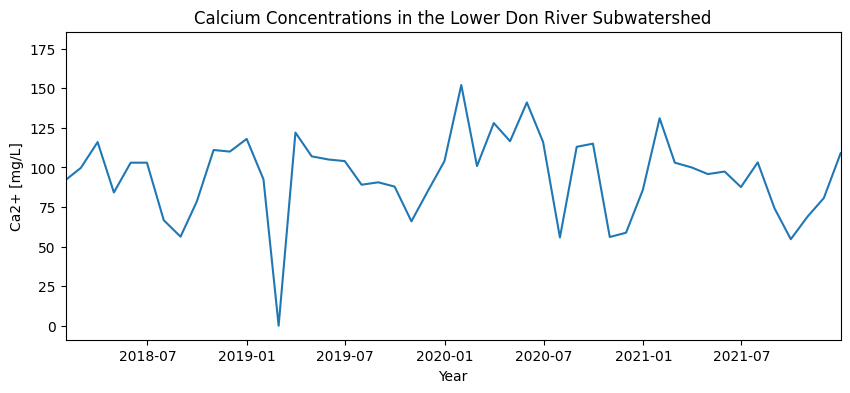

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt

# plot
_ = combinded_dataset.loc[combinded_dataset["major_basin"] == "Lower Don River"]
fig,ax = plt.subplots(figsize=(10, 4))

ax.plot(_.date, _["Ca2+"])
ax.set_title("Calcium Concentrations in the Lower Don River Subwatershed")
ax.set_ylabel("Ca2+ [mg/L]")
ax.set_xlabel("Year")
ax.set_xlim(combinded_dataset.iloc[636,0],combinded_dataset.iloc[683,0])

plt.show()

# Conclusion